# Mid-gestation fetal cortex dataset: QC and Filtering

_**Single cell transcriptomics dataset from paper published by Trevino et al. (Cell 2021) characterizing human fetal cortex at mid-gestation**._

## References

* <a href="https://www.cell.com/cell/fulltext/S0092-8674(21)00942-9?_returnURL=https%3A%2F%2Flinkinghub.elsevier.com%2Fretrieve%2Fpii%2FS0092867421009429%3Fshowall%3Dtrue"> Paper </a> 
* <a href="https://scbrainregulation.su.domains/">Dataset interactive Viewer </a> 

## General info

* Samples: **human fetal brain cortex at mid-gestation** (4 subjects from PCW16 to PCW24)
* Sequencing method: **single cell** RNASequencing (Chromium platform - 10x Genomics)
* Obtained number of cells: **~58,000**

__Upstream Steps__

* Assemble adata (see html file)


__This notebook__

* QC filter on cells
* Expression filter on genes
* Normalization and log10 transformation by Scanpy functions
* Feature selection (HVG) by Scanpy functions
* Dimensionality reduction
* Batch correction by Harmony
* Cluster identification

-----

# 1. Environment

## 1.1 Modules

In [1]:
import os
import sys

import numpy as np
import pandas as pd
import scanpy as sc
import scanpy.external as sce
from scipy.sparse import csr_matrix, isspmatrix

#Plotting
import matplotlib.pyplot as plt
import seaborn as sns

#ultils
#import ipynbname
from datetime import datetime

In [2]:
# Custom functions
sys.path.append('HelperFunctions')
import Day1Helper as fn
#help(fn)

In [3]:
print("Scanpy version: ", sc.__version__)
print("Pandas version: ", pd.__version__)

Scanpy version:  1.10.1
Pandas version:  2.2.2


## 1.2 Settings


In [4]:
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, fontsize=12)

## 1.3 Files and parameters

In [5]:
path = '../DataDir/InputData/'
Id = 'Day1_1_TrevinoAssembledAdata.h5ad'

input_file = path + Id
#output_file = 'MyPath' + 'Day1_2_TrevinoFiltNormAdata.h5ad'

In [6]:
#Cell filtering   
MIN_GENES = 850
MAX_GENES = 10000

MIN_COUNTS = 1500
MAX_COUNTS = 15000

PCT_MITO = 10
PCT_RIBO = 25

#Gene Filtering
PCT_CELLS = 0.25

In [7]:
# batch key for calculation of HVG and for Harmony correction 
BATCH_KEY = 'batch_key'

In [8]:
# Number of Principal component for UMAP
N_PCs = 18

In [9]:
# Leiden resolution chosen for clusters
chosen_leiden = 'Leiden_04'

## 1.4 Start computations

In [10]:
print(datetime.now())

2024-11-10 10:13:53.495453


----

# 2. Data Load


## Background

> Data are already structured as ann AnnData Object. 

**Anndata stores:**

> 1. a sparse or dense matrix (the count matrix in the case of scRNA-Seq) __(adata.X)__. Matrix dimensions: obs_names x var_names where the obs correspond to the cells’ barcodes and the var correspond to the gene identifiers
> 2. pandas dataframe-like annotation for observations __(adata.obs)__ and variables __(adata.var)__
> 3. matrices of calculations for the observations __(obsm)__ or variables __(varm)__
> 4. graph-like structures which associate cells with cells __(obsp)__ or genes __(varp)__ 
> 5. unstructured data __(adata.uns)__. 

> More values of X (e.g. raw and normalized data) can be stored in layers. 

<nav> <b> References: </b>

<a href="https://anndata.readthedocs.io/en/latest/"> Anndata ReadTheDocs </a> 
 </nav>


<img src="https://anndata.readthedocs.io/en/latest/_images/anndata_schema.svg" width="450">

## 2.1 Read adata file

In [11]:
adata = sc.read(input_file)
adata.var_names_make_unique()

In [12]:
adata

AnnData object with n_obs × n_vars = 57868 × 33355
    obs: 'Auth_Sample.ID', 'Auth_Age', 'Auth_Tissue.ID', 'Auth_Sample.Type', 'Auth_Assay', 'Auth_Batch', 'Auth_seurat_clusters', 'Auth_RNA.Counts', 'Auth_RNA.Features', 'Auth_Percent.MT', 'Auth_Percent.Ribo', 'Auth_Cell.Barcode', 'Auth_DF_pANN', 'Auth_DF_classification', 'Auth_DF_pANN_quantile', 'Auth_Spliced.Counts', 'Auth_Spliced.Features', 'Auth_Unspliced.Counts', 'Auth_Unspliced.Features', 'Auth_Ambiguous.Counts', 'Auth_Ambiguous.Features', 'dataset_id', 'sample_id', 'brain_region', 'age', 'stage', 'batch_key', 'cell_label'
    var: 'start_position', 'end_position', 'chromosome_name', 'ensg'

### A. __Count Matrix__
Stores the matrix of values: expression value of each gene in each cell.

In [13]:
adata.X

<57868x33355 sparse matrix of type '<class 'numpy.uint16'>'
	with 129517681 stored elements in Compressed Sparse Column format>

In [14]:
print(adata[:,['NES']].X[:40,])

  (1, 0)	3
  (2, 0)	1
  (4, 0)	1
  (6, 0)	1
  (16, 0)	10
  (20, 0)	1
  (21, 0)	1
  (22, 0)	2
  (23, 0)	1
  (30, 0)	2
  (34, 0)	1
  (39, 0)	1


### B. __Barcode metadata__
Adata.obs stores the metadata about the observations: cells (rows of the expression matrix).

In [15]:
print('Initial number of barcodes:', adata.n_obs)

Initial number of barcodes: 57868


In [16]:
print('Barcode names: ', adata.obs_names[:10].tolist())

Barcode names:  ['hft_w20_p3_r1_AAACCCAAGCTGCGAA', 'hft_w20_p3_r1_AAACCCAAGGTAGTAT', 'hft_w20_p3_r1_AAACCCACAACTCCAA', 'hft_w20_p3_r1_AAACCCACATAGTCAC', 'hft_w20_p3_r1_AAACCCAGTACAGGTG', 'hft_w20_p3_r1_AAACCCAGTACGGTTT', 'hft_w20_p3_r1_AAACCCAGTACTCGCG', 'hft_w20_p3_r1_AAACCCAGTATGTCCA', 'hft_w20_p3_r1_AAACCCAGTGTATTCG', 'hft_w20_p3_r1_AAACCCAGTTGCTCAA']


In [17]:
print('Available metadata for each barcode: ', adata.obs.columns)

Available metadata for each barcode:  Index(['Auth_Sample.ID', 'Auth_Age', 'Auth_Tissue.ID', 'Auth_Sample.Type',
       'Auth_Assay', 'Auth_Batch', 'Auth_seurat_clusters', 'Auth_RNA.Counts',
       'Auth_RNA.Features', 'Auth_Percent.MT', 'Auth_Percent.Ribo',
       'Auth_Cell.Barcode', 'Auth_DF_pANN', 'Auth_DF_classification',
       'Auth_DF_pANN_quantile', 'Auth_Spliced.Counts', 'Auth_Spliced.Features',
       'Auth_Unspliced.Counts', 'Auth_Unspliced.Features',
       'Auth_Ambiguous.Counts', 'Auth_Ambiguous.Features', 'dataset_id',
       'sample_id', 'brain_region', 'age', 'stage', 'batch_key', 'cell_label'],
      dtype='object')


In [18]:
adata.obs.head(3)

,Auth_Sample.ID,Auth_Age,Auth_Tissue.ID,Auth_Sample.Type,Auth_Assay,Auth_Batch,Auth_seurat_clusters,Auth_RNA.Counts,Auth_RNA.Features,Auth_Percent.MT,...,Auth_Unspliced.Features,Auth_Ambiguous.Counts,Auth_Ambiguous.Features,dataset_id,sample_id,brain_region,age,stage,batch_key,cell_label
hft_w20_p3_r1_AAACCCAAGCTGCGAA,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c16,1397,677,0.070866,...,54,94,69,Id0003,hft_w20_p3_r1,cerebral_cortex,PCW_20,prenatal,b2019_06_RNAv3,Microglia
hft_w20_p3_r1_AAACCCAAGGTAGTAT,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c11,14338,4301,0.053200,...,2526,1431,669,Id0003,hft_w20_p3_r1,cerebral_cortex,PCW_20,prenatal,b2019_06_RNAv3,GliaPg
hft_w20_p3_r1_AAACCCACAACTCCAA,hft_w20_p3_r1,pcw20,HFT3,HFT,RNA v3,b2019_06,c17,9260,3481,0.043511,...,2515,1095,669,Id0003,hft_w20_p3_r1,cerebral_cortex,PCW_20,prenatal,b2019_06_RNAv3,OPC_Oligo


<Axes: xlabel='sample_id'>

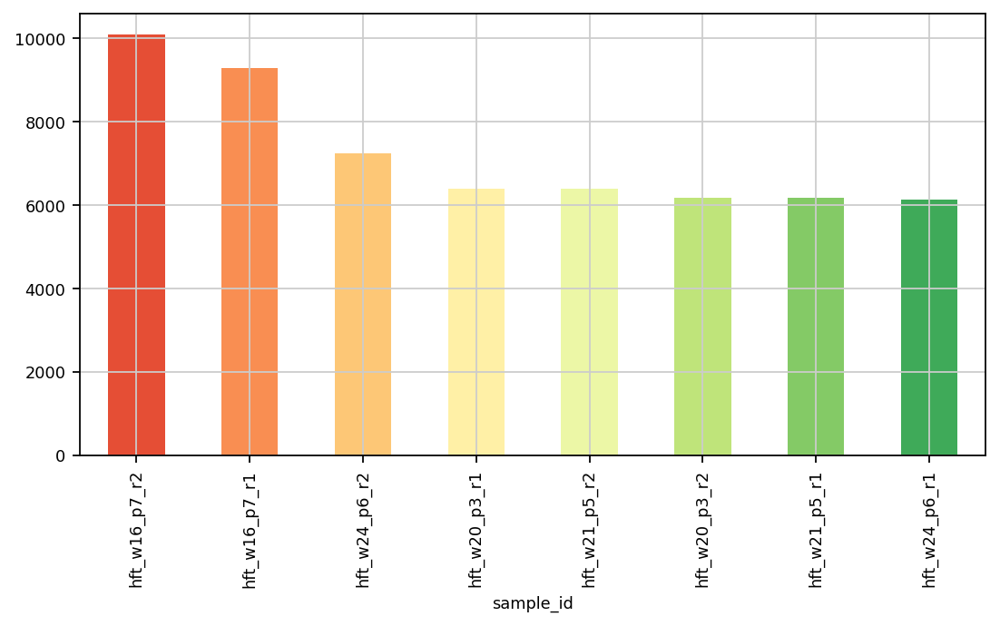

In [19]:
sc.settings.set_figure_params(fontsize=8, figsize=[8, 4])

category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, len(adata.obs['sample_id'].value_counts())))

adata.obs['sample_id'].value_counts().plot.bar(color=category_colors)

<Axes: xlabel='age'>

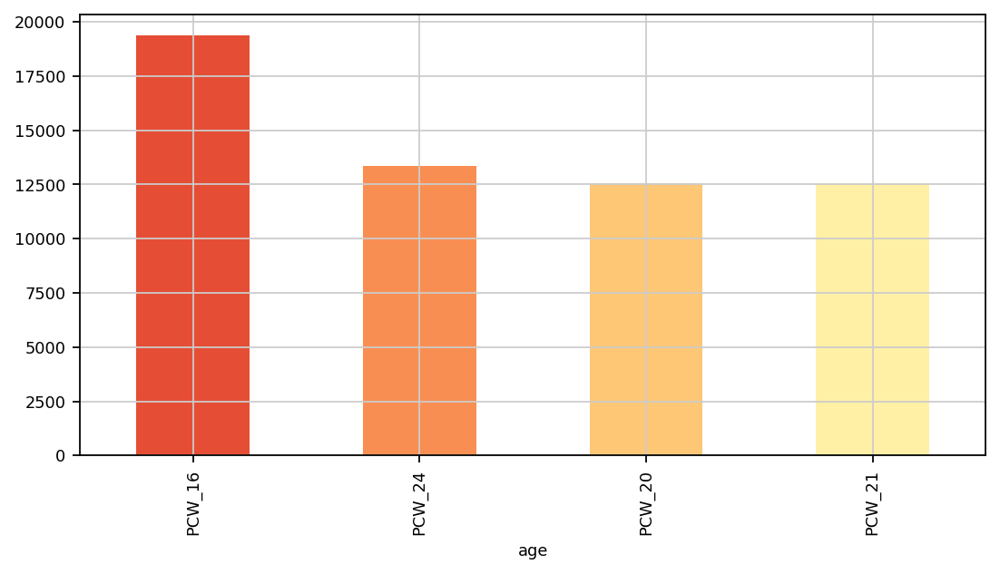

In [20]:
sc.settings.set_figure_params(fontsize=8, figsize=[8, 4])

category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, len(adata.obs['sample_id'].value_counts())))

adata.obs['age'].value_counts().plot.bar(color=category_colors)

<Axes: xlabel='cell_label'>

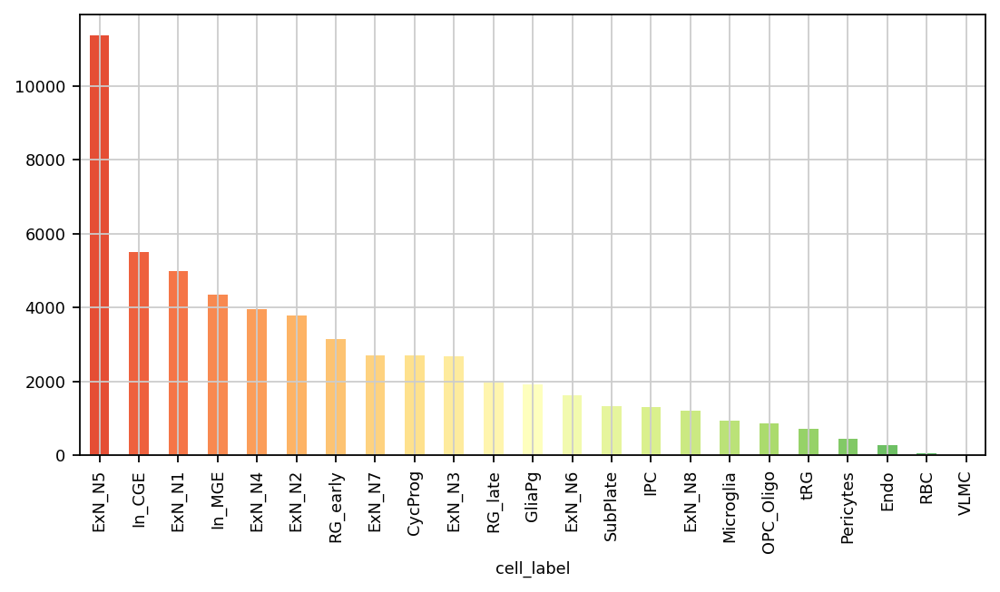

In [21]:
sc.settings.set_figure_params(fontsize=8, figsize=[8, 4])

category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, len(adata.obs['cell_label'].value_counts())))

adata.obs['cell_label'].value_counts().plot.bar(color=category_colors)

Starting from the authors' annotation, we also define a more high-level classification in cell_class:

In [22]:
Dict = {'ExN_N5': 'ExN', 'In_CGE': 'InN', 'ExN_N1': 'ExN',
        'In_MGE': 'InN', 'ExN_N4': 'ExN', 'ExN_N2': 'ExN', 
        'RG_early': 'Pg', 'ExN_N7': 'ExN', 'CycProg': 'Pg', 
        'ExN_N3': 'ExN', 'RG_late': 'Pg', 'GliaPg': 'Pg', 
        'ExN_N6': 'ExN', 'SubPlate': 'ExN', 'IPC': 'IPC', 
        'ExN_N8': 'ExN', 'Microglia': 'Microglia', 'OPC_Oligo': 'OPC_Oligo', 
        'tRG': 'Pg', 'Pericytes': 'Other', 'Endo': 'Other',
        'RBC': 'Other', 'VLMC': 'Other'
       }

adata.obs['cell_class'] = adata.obs['cell_label'].replace(Dict)

/tmp/ipykernel_36605/2535124292.py:11: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  adata.obs['cell_class'] = adata.obs['cell_label'].replace(Dict)


<Axes: xlabel='cell_class'>

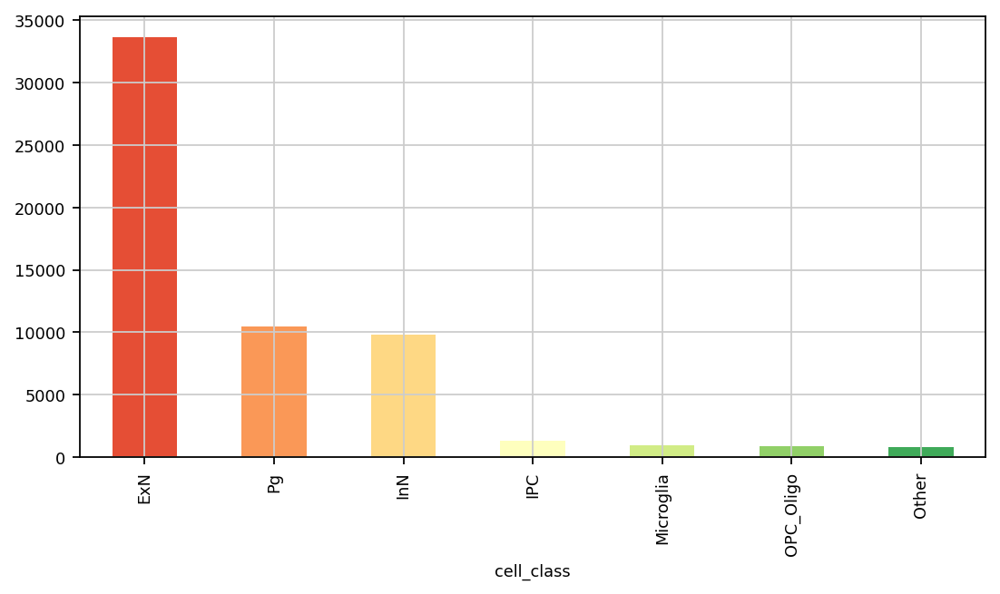

In [23]:
sc.settings.set_figure_params(fontsize=8, figsize=[8, 4])

category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, len(adata.obs['cell_class'].value_counts())))

adata.obs['cell_class'].value_counts().plot.bar(color=category_colors)

### C. __Gene metadata__

Adata.var stores the metadata about features: genes (columns of the expression matrix). 

In [24]:
adata.var[:5]

,start_position,end_position,chromosome_name,ensg
external_gene_name,,,,
MIR1302-2HG,29554.0,31109.0,1,ENSG00000243485
FAM138A,34554.0,36081.0,1,ENSG00000237613
OR4F5,65419.0,71585.0,1,ENSG00000186092
ENSG00000238009,89295.0,133566.0,1,ENSG00000238009
ENSG00000239945,89551.0,91105.0,1,ENSG00000239945


In [25]:
print('Initial number of genes:', adata.n_vars)

Initial number of genes: 33355


In [26]:
print('Gene names: ', adata.var_names[:10].tolist())

Gene names:  ['MIR1302-2HG', 'FAM138A', 'OR4F5', 'ENSG00000238009', 'ENSG00000239945', 'ENSG00000239906', 'ENSG00000241599', 'ENSG00000236601', 'OR4F29', 'ENSG00000235146']


In [27]:
print('Available metadata for each gene: ', adata.var.columns)

Available metadata for each gene:  Index(['start_position', 'end_position', 'chromosome_name', 'ensg'], dtype='object')


## 2.2 Top-expressed genes
The plot shows those genes that yield the highest fraction of counts in each single cells, across all cells.

normalizing counts per cell
    finished (0:00:00)


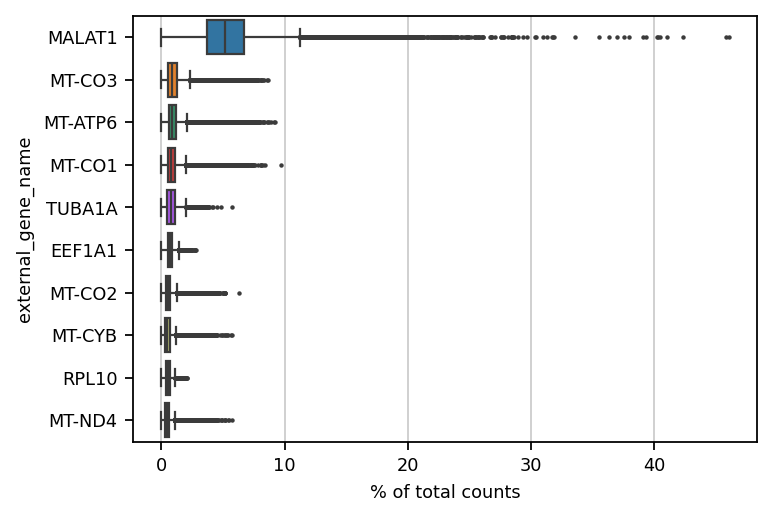

In [28]:
sc.pl.highest_expr_genes(adata, n_top=10)

## 2.3 Calculate QCs

In [29]:
#Find mito and ribo genes
mito_genes = adata.var_names.str.startswith('MT-')   
ribo_genes = adata.var_names.str.contains('^RPS|^RPL')

#qc_vars wants a column of adata.var containing T/F or 1/0 indicating the genes to be selected for sub-statistics
adata.var['mito'] = adata.var_names.str.startswith('MT-')    
adata.var['ribo']= adata.var_names.str.contains('^RPS|^RPL')

#Compute metrics (inplace=True to append to adata)
sc.pp.calculate_qc_metrics(adata, log1p=True, qc_vars=['mito','ribo'], inplace=True, percent_top=None)

In [30]:
adata.obs["gene_UMI_ratio"] = adata.obs["n_genes_by_counts"] / adata.obs["total_counts"]
adata.obs["log1p_gene_UMI_ratio"] = np.log1p(adata.obs["gene_UMI_ratio"])

In [31]:
adata

AnnData object with n_obs × n_vars = 57868 × 33355
    obs: 'Auth_Sample.ID', 'Auth_Age', 'Auth_Tissue.ID', 'Auth_Sample.Type', 'Auth_Assay', 'Auth_Batch', 'Auth_seurat_clusters', 'Auth_RNA.Counts', 'Auth_RNA.Features', 'Auth_Percent.MT', 'Auth_Percent.Ribo', 'Auth_Cell.Barcode', 'Auth_DF_pANN', 'Auth_DF_classification', 'Auth_DF_pANN_quantile', 'Auth_Spliced.Counts', 'Auth_Spliced.Features', 'Auth_Unspliced.Counts', 'Auth_Unspliced.Features', 'Auth_Ambiguous.Counts', 'Auth_Ambiguous.Features', 'dataset_id', 'sample_id', 'brain_region', 'age', 'stage', 'batch_key', 'cell_label', 'cell_class', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mito', 'log1p_total_counts_mito', 'pct_counts_mito', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'gene_UMI_ratio', 'log1p_gene_UMI_ratio'
    var: 'start_position', 'end_position', 'chromosome_name', 'ensg', 'mito', 'ribo', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_count

----

# 3. Discard low quality barcodes and lowly expressed genes

__Evaluate metrics related to quality as preliminary step for filtering.__ 

* __Mitochondrial gene counts:__ high proportions are indicative of poor-quality cells, related to loss of cytoplasmic RNA from perforated cells: mitochondrial transcripts are protected by mitochondrial membrane and therefore less likely to escape through tears in the cell membrane. 
* __Ribosomal Protein gene counts:__ high proportion are indicative of a shallow sequencing, because very highly expressed genes occupy most of the reads
* __n_genes_by_counts:__ the number of genes with at least 1 count in a cell
* __Total_Counts:__ total number of counts for a barcode

_For more information look at [scanpy.pp.calculate_qc_metrics documentation](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.calculate_qc_metrics.html)_


<div class="alert alert-block alert-info"><b> NOTE: </b> Thresholds are defined in the section 1.3 'Files and parameters'; they are first showed on diagnostic plots and then applied in the filtering step. 
    You can inspect and change them iteratively until you are satisfied by the results. 
</div>

## 3.1 Visualize thresholds on distribution

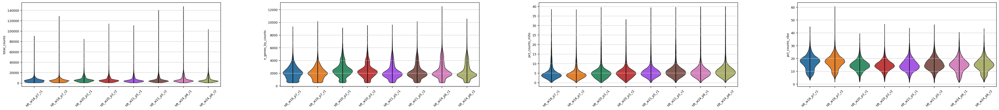

In [32]:
sc.pl.violin(adata, keys=['total_counts', 'n_genes_by_counts', 'pct_counts_mito', 'pct_counts_ribo'], groupby='sample_id',
             jitter=False, multi_panel=True, rotation=45)

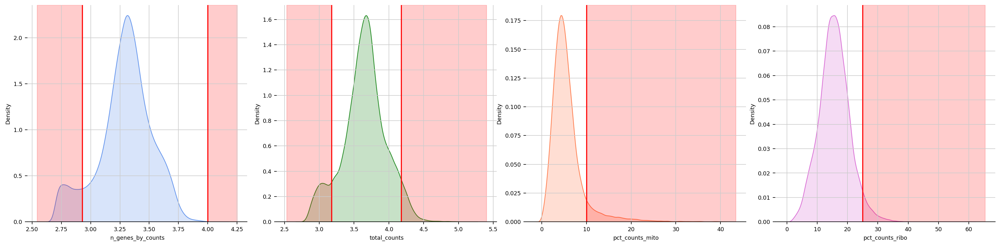

In [33]:
fn.densityQCs(adataObj = adata, hue=None, 
              min_counts = MIN_COUNTS, max_counts = MAX_COUNTS, 
              min_genes = MIN_GENES, max_genes = MAX_GENES, 
              pct_counts_mito = PCT_MITO, pct_counts_ribo = PCT_RIBO)

## 3.2 Barplot of discarded barcodes

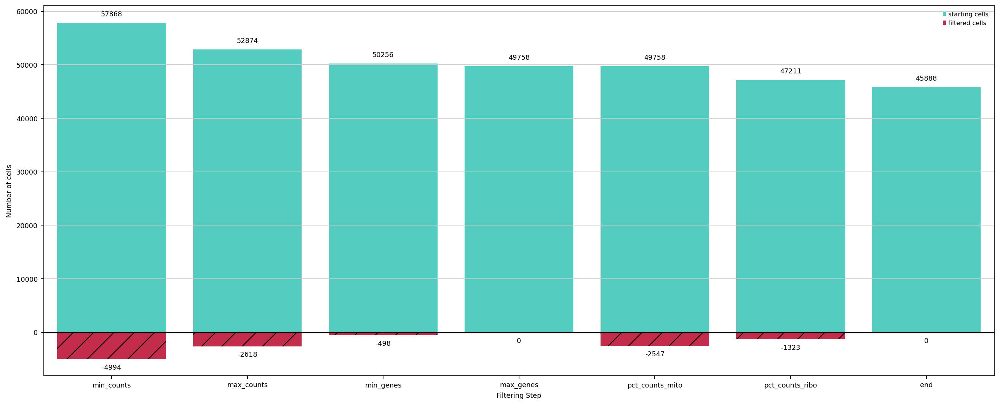

In [34]:
fn.filterCellBarplot(adataObj=adata,
                     min_counts=MIN_COUNTS, max_counts=MAX_COUNTS,
                     min_genes=MIN_GENES, max_genes=MAX_GENES,
                     pct_counts_mito = PCT_MITO, pct_counts_ribo = PCT_RIBO)

## 3.3 Filtering barcodes

In [35]:
print('\nThe selected filtering parameters are:' 
      '\n Minimum counts: ' , MIN_COUNTS, '\n Maximum counts:' , MAX_COUNTS,
      '\n Minimum genes: ' , MIN_GENES, '\n Maximum genes:' , MAX_GENES,
      '\n Mitocondia: ' , PCT_MITO, '%', '\n Ribosomal: ', PCT_RIBO, '%')


The selected filtering parameters are:
 Minimum counts:  1500 
 Maximum counts: 15000 
 Minimum genes:  850 
 Maximum genes: 10000 
 Mitocondia:  10 % 
 Ribosomal:  25 %


### 3.3.1 Detected Genes

In [36]:
sc.pp.filter_cells(adata, min_genes=MIN_GENES)
sc.pp.filter_cells(adata, max_genes=MAX_GENES)

print('After filtering detected genes: number of cells:', adata.n_obs)

filtered out 5104 cells that have less than 850 genes expressed
filtered out 6 cells that have more than 10000 genes expressed
After filtering detected genes: number of cells: 52758


### 3.3.2 UMI Counts

In [37]:
sc.pp.filter_cells(adata, min_counts = MIN_COUNTS)
sc.pp.filter_cells(adata, max_counts = MAX_COUNTS)

print('After filtering on min UMI counts:number of cells:', adata.n_obs)

filtered out 388 cells that have less than 1500 counts
filtered out 2612 cells that have more than 15000 counts
After filtering on min UMI counts:number of cells: 49758


### 3.3.3 Mitochondrial RNA

In [38]:
adata = adata[adata.obs['pct_counts_mito'] < PCT_MITO, :]

print('After filtering on mitochondrial RNA: number of cells:', adata.n_obs)

After filtering on mitochondrial RNA: number of cells: 47211


### 3.3.4 Ribosomal RNA

In [39]:
adata = adata[adata.obs['pct_counts_ribo'] < PCT_RIBO, :]

print('After filtering on ribosomal protein RNA: number of cells:', adata.n_obs)

After filtering on ribosomal protein RNA: number of cells: 45888


## 3.4 Filtering genes


In [40]:
MIN_CELLS = np.rint((adata.n_obs*PCT_CELLS)/100) 

print('\nGene expressed in less than ', PCT_CELLS, '% cells, corresponding to a number of ', 
     MIN_CELLS, ', are filtered out.')


Gene expressed in less than  0.25 % cells, corresponding to a number of  115.0 , are filtered out.


In [41]:
print('Before gene filtering: number of genes:', adata.n_vars)

Before gene filtering: number of genes: 33355


In [42]:
sc.pp.filter_genes(adata, min_cells=MIN_CELLS)

filtered out 17031 genes that are detected in less than 115.0 cells


/usr/local/lib/python3.10/dist-packages/scanpy/preprocessing/_simple.py:275: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  adata.var["n_cells"] = number


In [43]:
print('After gene filtering: number of genes:', adata.n_vars)

After gene filtering: number of genes: 16324


## 3.5 Numbers after filtering

In [44]:
print('After applied filtering: number of cells:', adata.n_obs)
print('After applied filtering: number of genes:', adata.n_vars)

After applied filtering: number of cells: 45888
After applied filtering: number of genes: 16324


<Axes: xlabel='sample_id'>

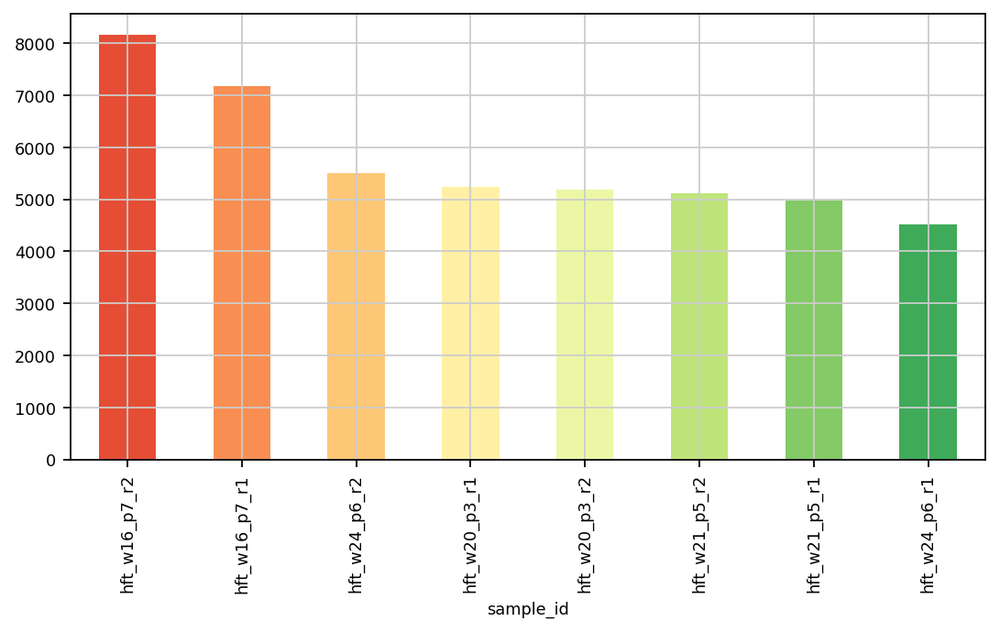

In [45]:
sc.settings.set_figure_params(fontsize=8, figsize=[8, 4])

category_colors = plt.colormaps['RdYlGn'](
        np.linspace(0.15, 0.85, len(adata.obs['sample_id'].value_counts())))

adata.obs['sample_id'].value_counts().plot.bar(color=category_colors)

----

# 4. Normalize and Log Transform 

* Store raw counts in 'counts' layer
* Normalize and log-transform
* Store in 'lognormcounts' layer

## 4.1 Store raw counts in 'counts' layer

In [46]:
adata.layers['counts'] = adata.X.copy()

In [47]:
print(adata.X[:, adata.var_names == 'ACTB'][:6])

  (0, 0)	36
  (1, 0)	13
  (2, 0)	6
  (3, 0)	13
  (4, 0)	12
  (5, 0)	32


## 4.2 Basic Scanpy Normalization

Some useful parameters to keep in mind from the scanpy documentation for [sc.pp.normalize_total](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.normalize_total.html)
>- `target_sum` : If None, after normalization, each observation (cell) has a total count equal to the **median of total counts for observations (cells) before normalization**.
>- `exclude_highly_expressed` : Exclude (very) highly expressed genes for the computation of the normalization factor (size factor) for each cell. **A gene is considered highly expressed, if it has more than max_fraction of the total counts in at least one cell**. The not-excluded genes will sum up to target_sum.
>- `max_fraction` : float (**default: 0.05**) If exclude_highly_expressed=True, consider cells as highly expressed that have more counts than max_fraction of the original total counts in at least one cell.

In [48]:
sc.pp.normalize_total(adata, target_sum=1e4, exclude_highly_expressed=True)
sc.pp.log1p(adata)

normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['SPP1', 'FABP7', 'NPY', 'HBG2', 'FTH1', 'MALAT1', 'HBA2', 'HBA1', 'CCL3', 'CCL4', 'CCL3L3', 'CCL4L2', 'FTL']
    finished (0:00:00)


## 4.3 Store normalized counts

In [49]:
adata.layers['lognormcounts']=adata.X.copy()

In [50]:
print(adata.layers['lognormcounts'][:, adata.var_names == 'ACTB'][:6])

  (0, 0)	3.31702100370616
  (1, 0)	2.74287886342992
  (2, 0)	2.862554522458528
  (3, 0)	3.013129919072555
  (4, 0)	3.0224127335562008
  (5, 0)	3.6503539069618682


## 4.4 Alternative workflow: normalization by Scran

<div class="alert alert-block alert-warning"><b>FOOD for THOUGHTS: normalize with Scran</b>

    
<nav> <b> References: </b>
<a href="https://genomebiology.biomedcentral.com/articles/10.1186/s13059-016-0947-7"> Scran Paper </a> |
<a href="https://bioconductor.org/packages/release/bioc/vignettes/scran/inst/doc/scran.html">Scran R Vignette </a> |
<a href="https://github.com/theislab/single-cell-tutorial/blob/master/latest_notebook/Case-study_Mouse-intestinal-epithelium_1906.ipynb">Theis Scran Tutorial in scanpy </a> |
 </nav>
    

Normalizing cell-specific biases

Cell-specific biases are normalized using the computeSumFactors() method, which implements the deconvolution strategy for scaling normalization (A. T. Lun, Bach, and Marioni 2016). This computes size factors that are used to scale the counts in each cell. The assumption is that most genes are not differentially expressed (DE) between cells , such that any differences in expression across the majority of genes represents some technical bias that should be removed.



# 5. Feature selection: Highly Variable Genes

## 5.1 Scanpy workflow

__NB: batch argument allows to minimize contribution of batch-related genes to HVG selection__

We can perform batch-aware highly variable gene selection by setting the batch_key argument. HVGs will be calculated for each batch separately and combine the results by selecting those genes that are highly variable in the highest number of batches.

In [51]:
# specified values are the default
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5, batch_key=BATCH_KEY)
print('Number of Higly Variable Genes', len(adata.var_names[adata.var['highly_variable'] == True]))

extracting highly variable genes
    finished (0:00:05)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Number of Higly Variable Genes 1545


## 5.2 Alternative workflow: Triku

<div class="alert alert-block alert-warning"><b>FOOD for THOUGHTS: feature selection by Triku</b>
<nav> <b> Sources: </b>
<a href="https://academic.oup.com/gigascience/article/doi/10.1093/gigascience/giac017/6547682"> Triku Paper </a> |
<a href="https://triku.readthedocs.io/en/latest/triku-work.html"> Docs </a> |
 </nav>

The premise of triku is that, for genes with similar expression levels, the expression pattern can be categorized in three states: 

- i: the gene is expressed throughout the cells with similar expression levels **(a)**: NO useful information about specific cell types associated to that gene
- ii: the expression of the gene can be localized in a subset of cells, which can in turn be:
    - Transcriptomically different cells **(b1)** (i.e. cells that are not neighbours in the dimensionally reduced map)
    - Transcriptomically similar cells **(b2)** (neighbours): the gene is more probably biologically relevant for that population

![](https://triku.readthedocs.io/en/latest/_images/cluster_distribution.svg)

**Triku aims to select genes of case (b2)** while avoiding the selection of genes of case (a) and (b1). 

It does so by **looking at the expression in the nearest neighbours**

![](https://triku.readthedocs.io/en/latest/_images/knn_scheme.svg)

 <b>FOOD for THOUGHTS: Batch effect could influence HVG selection. </b> You can consider to correct (e.g. with Harmony) the neighbors used to compute the HVGs. For this dataset we did not notice a big difference between the two procedures.

# 6. Dimensionality Reduction

* scRNA-seq datasets are characterized by high dimensions (number of cells and genes).
* to select the most informative features (genes), dimensionality reduction algorithms are applied.
* these algorithms are a key pre-processing step to reduce data complexity and for visualization purposes. 

## 6.1 PCA

* PCA apply an orthogonal transformation of the original dataset creating a new set of uncorrelated variables (principal components, PC) that are a linear combination of the original features. 
* In the context of scRNASeq, PCA is used to select the top PCs that are used for downstream analytical tasks.
* The number of PCs to retain for downstream analyses is generally chosen on the basis of the amount of variance explained by each of them. Using more PCs will retain more biological signal at the cost of including more noise.

In [52]:
sc.pp.pca(adata, n_comps=30, mask_var='highly_variable', svd_solver='arpack')

computing PCA
    with n_comps=30
    finished (0:00:04)


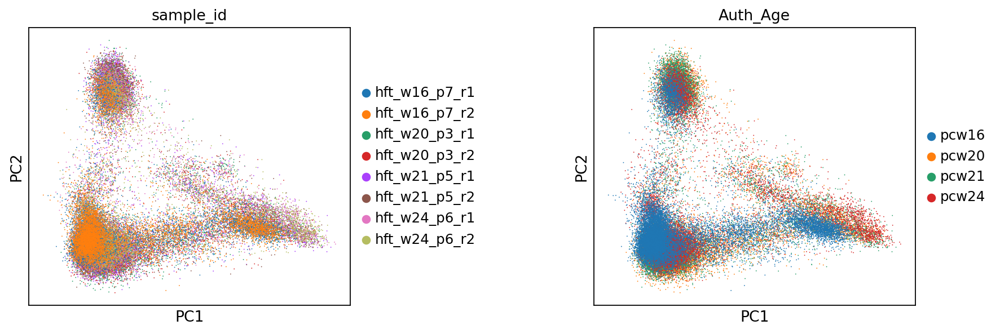

In [53]:
sc.settings.set_figure_params(dpi=80, fontsize=12)
sc.pl.pca(adata, color=['sample_id', 'Auth_Age'], ncols=2, wspace=0.6)

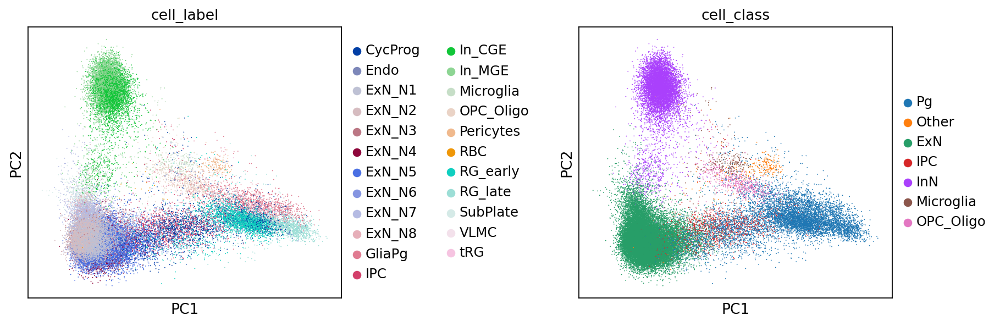

In [54]:
sc.pl.pca(adata, color=['cell_label', 'cell_class'], ncols=2, wspace=0.6)

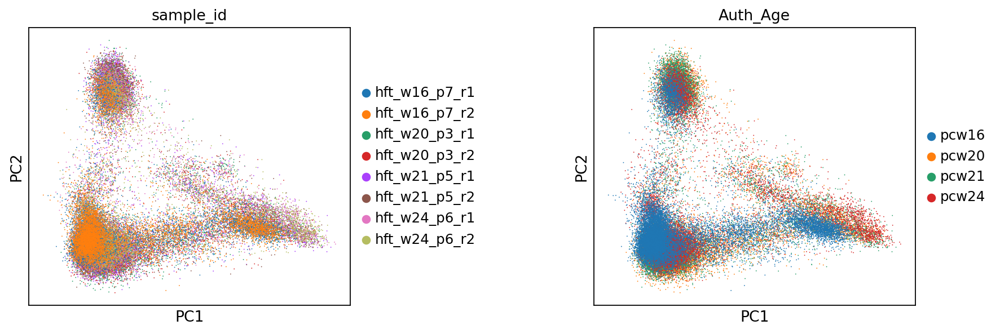

In [55]:
sc.settings.set_figure_params(dpi=80, fontsize=12)
sc.pl.pca(adata, color=['sample_id', 'Auth_Age'], ncols=2, wspace=0.6)

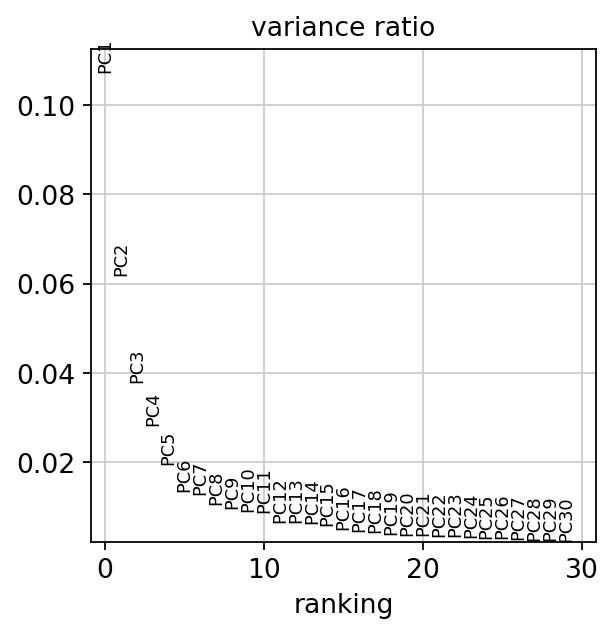

In [56]:
sc.pl.pca_variance_ratio(adata)

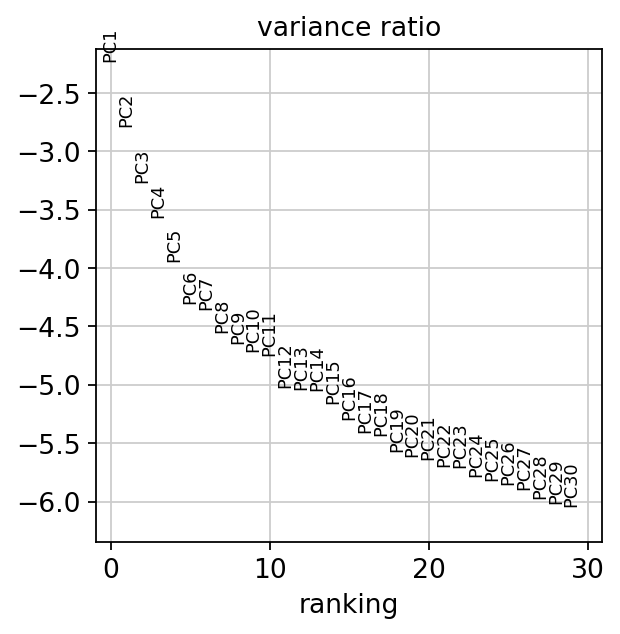

In [57]:
sc.pl.pca_variance_ratio(adata, log=True)

## 6.2 Neighbours 

[sc.pp.neighbors](https://scanpy.readthedocs.io/en/stable/generated/scanpy.pp.neighbors.html) computes a neighborhood graph of observations. The cells are embedded in a graph structure with edges drawn between cells with similar feature expression patterns. A k-nearest neigbour graph will connect each cell with the its k-nearest neigbours.

__Key parameters:__ 
> * `n_pcs`: number of PC used for compute the kNN graph
> * `n_neighbors`: number of neighbors. Larger neighbor values will result in more global structure being preserved at the loss of detailed local structure. 
> * `metrics`: distance metric used in the calculation

In [58]:
N_NB = int(0.5 * len(adata) ** 0.5)
if N_NB > 80:
    N_NB = 80
print(N_NB) 

80


In [59]:
sc.pp.neighbors(adata, n_neighbors=N_NB, n_pcs=N_PCs, key_added="pca")

computing neighbors
    using 'X_pca' with n_pcs = 18
    finished: added to `.uns['pca']`
    `.obsp['pca_distances']`, distances for each pair of neighbors
    `.obsp['pca_connectivities']`, weighted adjacency matrix (0:01:15)


## 6.3 UMAP

UMAP is a graph based, non-linear dimensionality technique. It constructs a high dimensional graph representation of the dataset and optimizes the low-dimensional graph representation to be structurally as similar as possible to the original graph.

More information: 
* [UMAP ReadTheDocs](https://umap-learn.readthedocs.io/en/latest/how_umap_works.html)
* [Understanding UMAP](https://pair-code.github.io/understanding-umap/)
* [Dimensionality reduction for visualizing single-cell data using UMAP](https://www.nature.com/articles/nbt.4314)

In [60]:
sc.tl.umap(adata, random_state=1, neighbors_key="pca")
# store coordinates in a named slot so to avoid confusion with batch-corrected
adata.obsm["X_umap_nocorr"] = adata.obsm["X_umap"].copy()
del adata.obsm["X_umap"]

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:37)


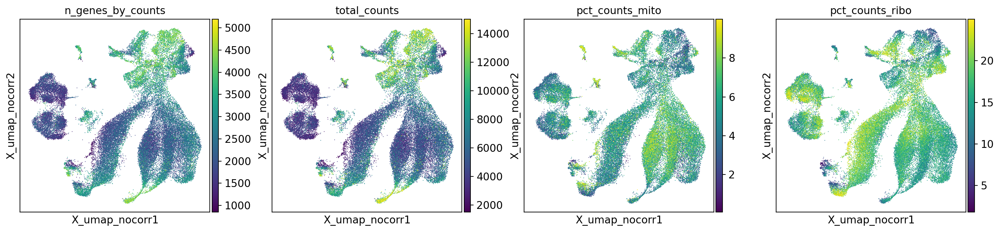

In [61]:
sc.pl.embedding(adata, basis="X_umap_nocorr", 
                color=['n_genes_by_counts',"total_counts", 'pct_counts_mito', 'pct_counts_ribo'])

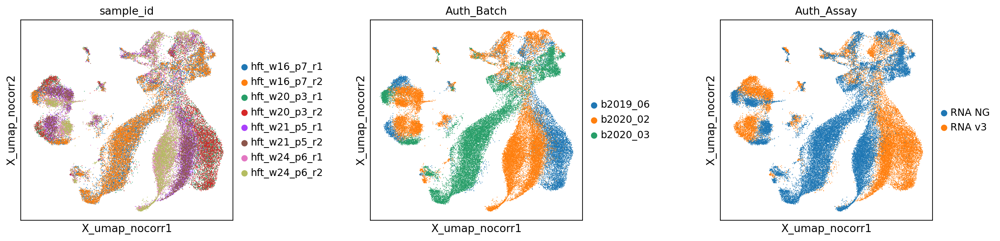

In [62]:
sc.pl.embedding(adata,  basis="X_umap_nocorr", color=['sample_id', 'Auth_Batch', 'Auth_Assay'], wspace=0.5)

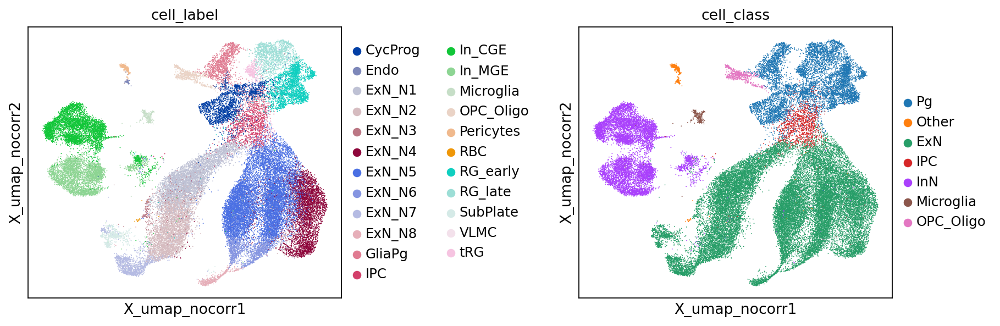

In [63]:
if 'cell_label' in adata.obs.columns:
    sc.pl.embedding(adata, basis="X_umap_nocorr", color=['cell_label', 'cell_class'],  wspace=0.6)

# 7. Batch correction by Harmony

<div class="alert alert-block alert-info"> 

From the UMAP it is noticeable the presence of a potential batch effect. We therefore apply a batch correction using Harmony algorithm.  
    
<b>NOTE: we are CORRECTING FOR the created variable 'batch_key', that collapse information contained in original variables Batch and Assay (see detailes in html notebook on data assembly)</b>.

Alternative strategies could be attempted varying the correction. 
    
</div>

Harmony uses an iterative clustering approach to align cells from different batches. For each iteration: 

* soft k-means clustering to group cells from multiple datasets 
* computation for each cluster of a global centroid and a dataset-specific centroid 
* from the centroids, calculation of a correction factor 
* the correction factor is used to correct each cell with a cell-specific factor 

__References__: [Harmony Quick Start](https://portals.broadinstitute.org/harmony/articles/quickstart.html)  

<img src="https://portals.broadinstitute.org/harmony/articles/main.jpg" width="750">

In [64]:
sc.external.pp.harmony_integrate(adata, BATCH_KEY)

2024-11-10 10:16:32,714 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-11-10 10:16:36,657 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-11-10 10:16:36,770 - harmonypy - INFO - Iteration 1 of 10
2024-11-10 10:16:42,803 - harmonypy - INFO - Iteration 2 of 10
2024-11-10 10:16:48,944 - harmonypy - INFO - Iteration 3 of 10
2024-11-10 10:16:55,131 - harmonypy - INFO - Iteration 4 of 10
2024-11-10 10:17:01,443 - harmonypy - INFO - Iteration 5 of 10
2024-11-10 10:17:05,133 - harmonypy - INFO - Converged after 5 iterations


In [65]:
sc.pp.neighbors(adata, n_neighbors=N_NB, n_pcs=N_PCs, use_rep='X_pca_harmony', key_added='harmony')

computing neighbors
    finished: added to `.uns['harmony']`
    `.obsp['harmony_distances']`, distances for each pair of neighbors
    `.obsp['harmony_connectivities']`, weighted adjacency matrix (0:00:29)


# 8. Batch-corrected dimensionality reduction

## 8.1 UMAP

In [66]:
sc.tl.umap(adata, random_state=1, neighbors_key="harmony")
adata.obsm["X_umap_harmony"] = adata.obsm["X_umap"].copy()
del adata.obsm["X_umap"]

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)


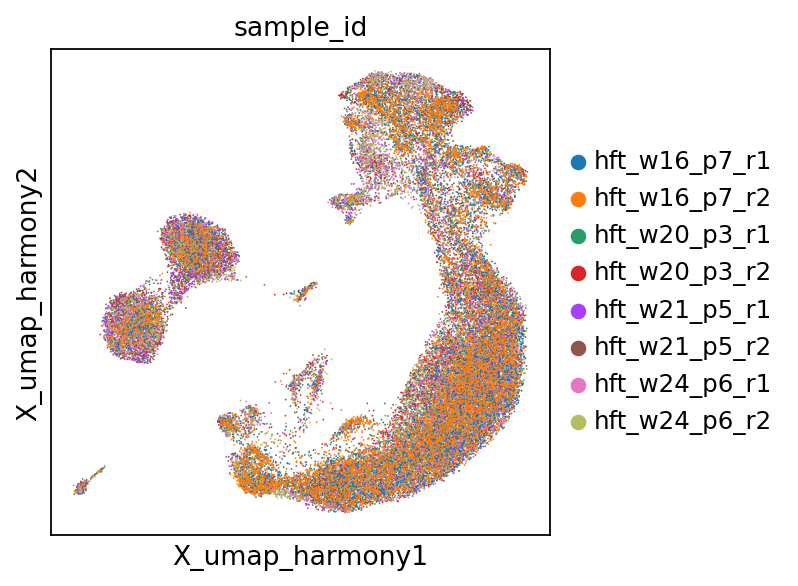

In [67]:
sc.pl.embedding(adata, basis="X_umap_harmony", color=['sample_id'])

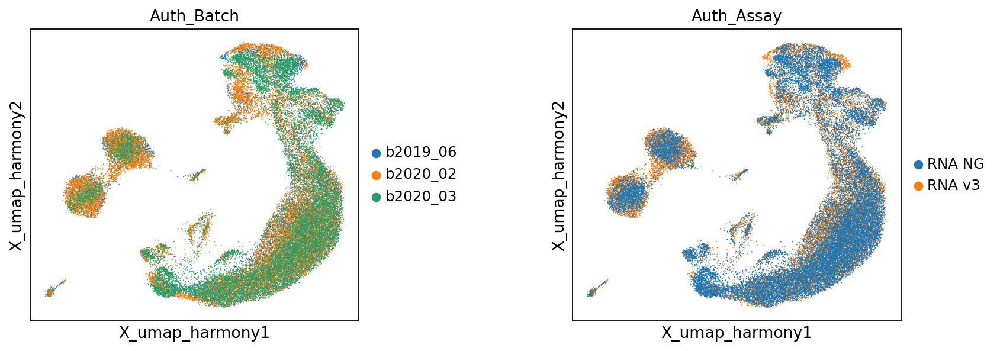

In [68]:
if 'cell_label' in adata.obs.columns:
    sc.pl.embedding(adata, basis="X_umap_harmony", color=['Auth_Batch', 'Auth_Assay'], wspace=0.5)

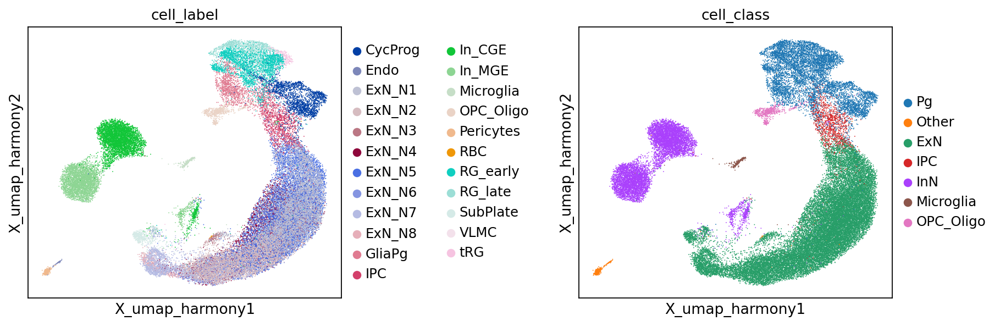

In [69]:
if 'cell_label' in adata.obs.columns:
    sc.pl.embedding(adata, basis="X_umap_harmony", color=['cell_label', 'cell_class'], wspace=0.6)

## 8.2 Diffusion Map

In [70]:
sc.tl.diffmap(adata, random_state=1, neighbors_key="harmony")
adata.obsm["X_diffmap_harmony"] = adata.obsm["X_diffmap"].copy()
del adata.obsm["X_diffmap"]

computing Diffusion Maps using n_comps=15(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9978727  0.997619   0.9959176  0.9901216  0.98953676
     0.98908776 0.9882305  0.9872574  0.98002154 0.9738048  0.96652436
     0.96429473 0.96306354 0.9566146 ]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:02)


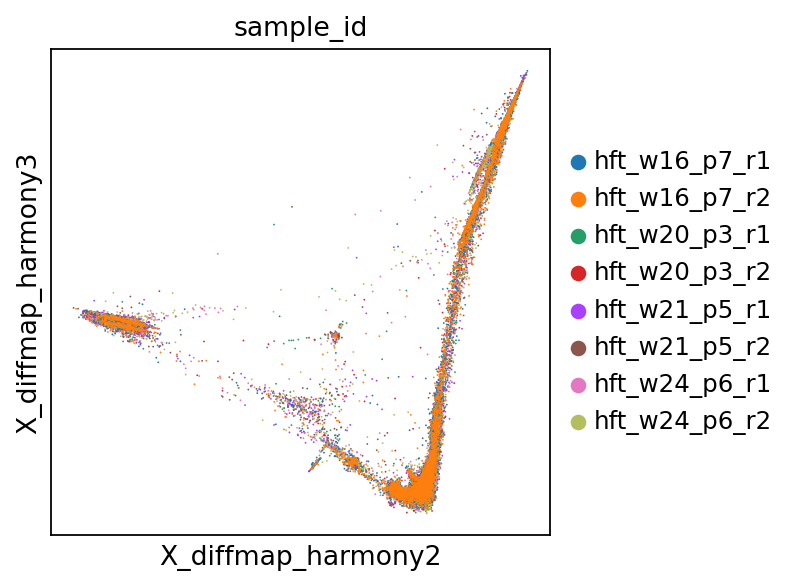

In [71]:
sc.pl.embedding(adata, basis="X_diffmap_harmony", components=['2,3'], color=['sample_id'])

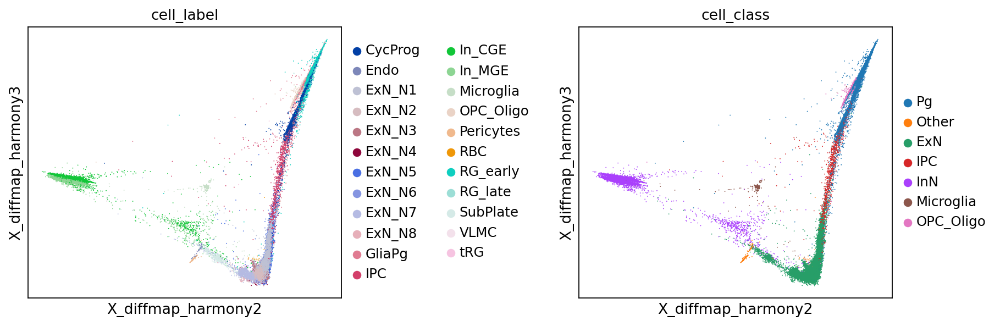

In [72]:
if 'cell_label' in adata.obs.columns:
    sc.pl.embedding(adata, basis="X_diffmap_harmony", components=['2,3'], color=['cell_label', 'cell_class'], wspace=0.6)

# 9. Clusters

* We use graph-based clustering algorithms, that, starting from neighbourhood graph, aim at identifying “communities” of cells that are more connected to cells in the same community than they are to cells of different communities.
* Each community represents a cluster that is then subjected to downstream characterization.
* Here we apply Leiden algorithm ([reference paper](https://www.nature.com/articles/s41598-019-41695-z)). Advantages: computationally efficient; solves issue of detection of badly connected communities that somentimes happens with Louvain algorithm.
* Different resolution values are tested; lower values result in a smaller number of bigger clusters, while higher values detect a bigger number of small clusters.

## 9.1 Cluster Identification

In [73]:
leiden_res = [0.2, 0.4, 0.6, 1.0]
leiden_labels = []

for x in leiden_res:
    label = "Leiden_" + str(x).replace('.', '')
    leiden_labels.append(label) 
    # updated with future scanpy deafult
    sc.tl.leiden(adata, resolution=x, key_added=label, neighbors_key="harmony", 
                 flavor='igraph', n_iterations=2, directed=False, random_state=0)

running Leiden clustering
    finished: found 10 clusters and added
    'Leiden_02', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 13 clusters and added
    'Leiden_04', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 15 clusters and added
    'Leiden_06', the cluster labels (adata.obs, categorical) (0:00:07)
running Leiden clustering
    finished: found 19 clusters and added
    'Leiden_10', the cluster labels (adata.obs, categorical) (0:00:07)


## 9.2 Clusters on UMAP

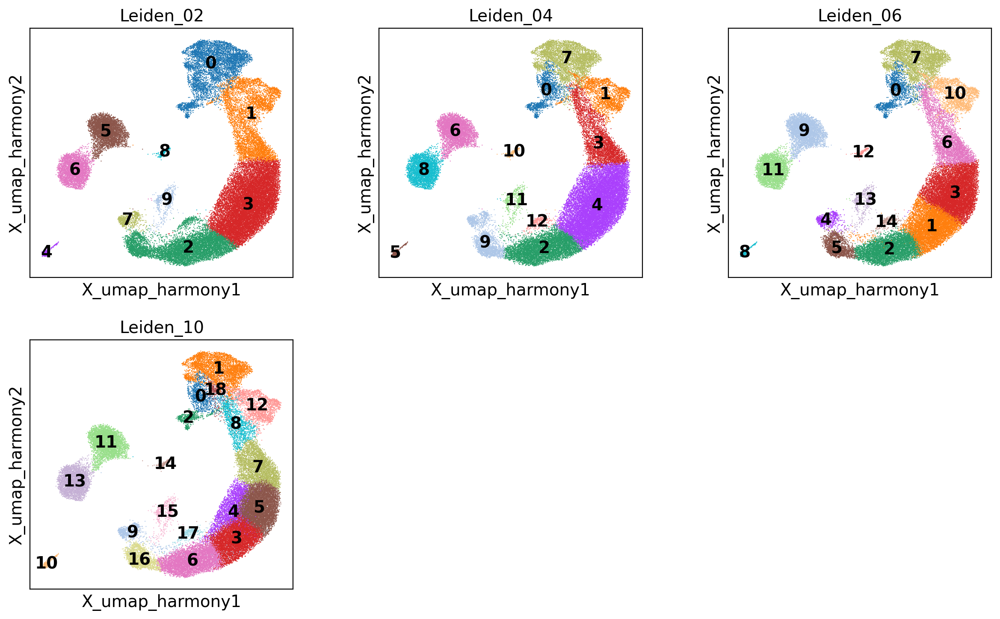

In [74]:
sc.settings.set_figure_params(dpi=100)
sc.pl.embedding(adata, basis="X_umap_harmony", color=leiden_labels, 
               ncols=3, legend_loc='on data')

## 9.3 Choose resolution

In [75]:
adata.obs['Leiden_Sel'] = adata.obs[chosen_leiden]

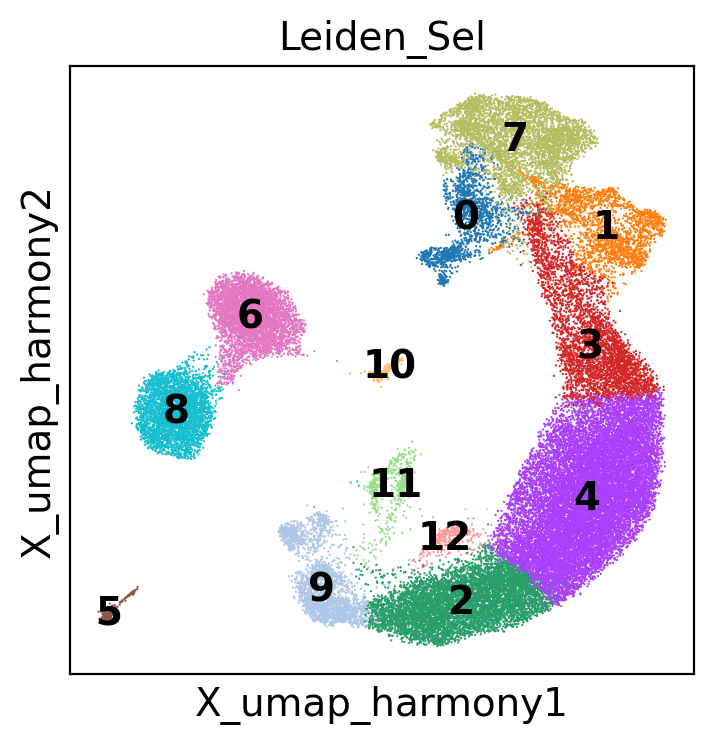

In [76]:
sc.pl.embedding(adata, basis="X_umap_harmony", color='Leiden_Sel',
                legend_loc='on data')

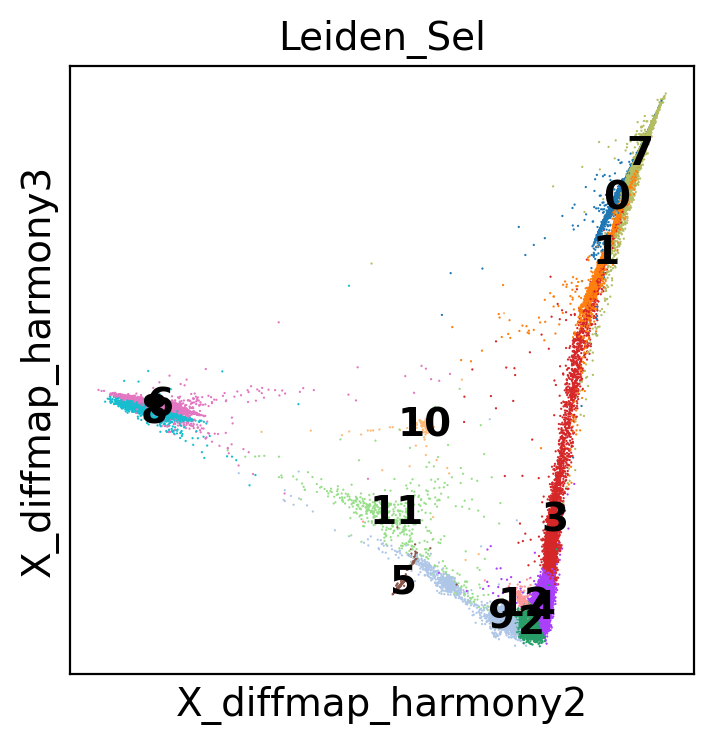

In [77]:
sc.pl.embedding(adata, basis="X_diffmap_harmony", components=['2,3'], 
                color='Leiden_Sel', legend_loc='on data')

# 10. Saving

## 10.1 Save Adata

In [78]:
type(adata.X)

scipy.sparse._csc.csc_matrix

In [79]:
#adata.write(output_file)

## 10.2 Finished computations: timestamp

In [80]:
print(datetime.now())

2024-11-10 10:18:50.550824


## 10.3 Save python and html versions

In [81]:
nb_fname = '1_FiltNormBatch'

In [83]:
%%bash -s "$nb_fname"
jupyter nbconvert "$1".ipynb --to="python"
jupyter nbconvert "$1".ipynb --to="html"

[NbConvertApp] Converting notebook 1_FiltNormBatch.ipynb to python
[NbConvertApp] Writing 24153 bytes to 1_FiltNormBatch.py
[NbConvertApp] Converting notebook 1_FiltNormBatch.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 27 image(s).
[NbConvertApp] Writing 11081685 bytes to 1_FiltNormBatch.html
